# 🌸 Iris Flower Classification: A Complete ML Portfolio Piece

The Iris flower data set or Fisher's Iris data set is a multivariate data set used and made famous by the British statistician and biologist Ronald Fisher in his 1936 paper The use of multiple measurements in taxonomic problems as an example of linear discriminant analysis. It is sometimes called Anderson's Iris data set because Edgar Anderson collected the data to quantify the morphologic variation of Iris flowers of three related species. Two of the three species were collected in the Gaspé Peninsula "all from the same pasture, and picked on the same day and measured at the same time by the same person with the same apparatus".

The data set consists of 50 samples from each of three species of Iris (Iris setosa, Iris virginica and Iris versicolor). Four features were measured from each sample: the length and the width of the sepals and petals, in centimeters. Based on the combination of these four features, Fisher developed a linear discriminant model to distinguish each species. Fisher's paper was published in the Annals of Eugenics (today the Annals of Human Genetics).

<img src="https://miro.medium.com/v2/resize:fit:1400/1*ZK9_HrpP_lhSzTq9xVJUQw.png" alt="image info" />

> In this project, we aim to classify Iris flowers into their correct species (Setosa, Versicolor, Virginica) using machine learning algorithms. We compare the effectiveness of various classifiers, analyze decision boundaries, and investigate feature importance.

## Data Loading & Initial Inspection

import opendatasets as od
dataset_url = "https://www.kaggle.com/datasets/arshid/iris-flower-dataset/code"
od.download(dataset_url)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score

iris_csv = "iris-flower-dataset./IRIS.csv"
iris_data = pd.read_csv(iris_csv)
iris_data

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,Iris-virginica
146,6.3,2.5,5.0,1.9,Iris-virginica
147,6.5,3.0,5.2,2.0,Iris-virginica
148,6.2,3.4,5.4,2.3,Iris-virginica


In [2]:
type(iris_data)

pandas.core.frame.DataFrame

In [3]:
iris_data.dtypes

sepal_length    float64
sepal_width     float64
petal_length    float64
petal_width     float64
species          object
dtype: object

In [4]:
iris_data.describe()

,sepal_length,sepal_width,petal_length,petal_width
count,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.054000,3.758667,1.198667
std,0.828066,0.433594,1.764420,0.763161
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.350000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


In [5]:
iris_data["species"].unique()

array(['Iris-setosa', 'Iris-versicolor', 'Iris-virginica'], dtype=object)

In [6]:
iris_data["species"].value_counts()

species
Iris-setosa        50
Iris-versicolor    50
Iris-virginica     50
Name: count, dtype: int64

In [7]:
iris_data.isna().sum()

sepal_length    0
sepal_width     0
petal_length    0
petal_width     0
species         0
dtype: int64

## Exploratory Data Analysis (EDA)
> Here, we explore the dataset to understand its structure and characteristics, ensuring data quality and identifying potential patterns or outliers.

In [8]:
# iris_data.hist()

In this plot, we explore the distribution of each feature (sepal_length, sepal_width, petal_length, petal_width) across the three Iris species (Setosa, Versicolor, Virginica). This analysis helps us identify the separability and overlaps between different flower species based on their characteristics.

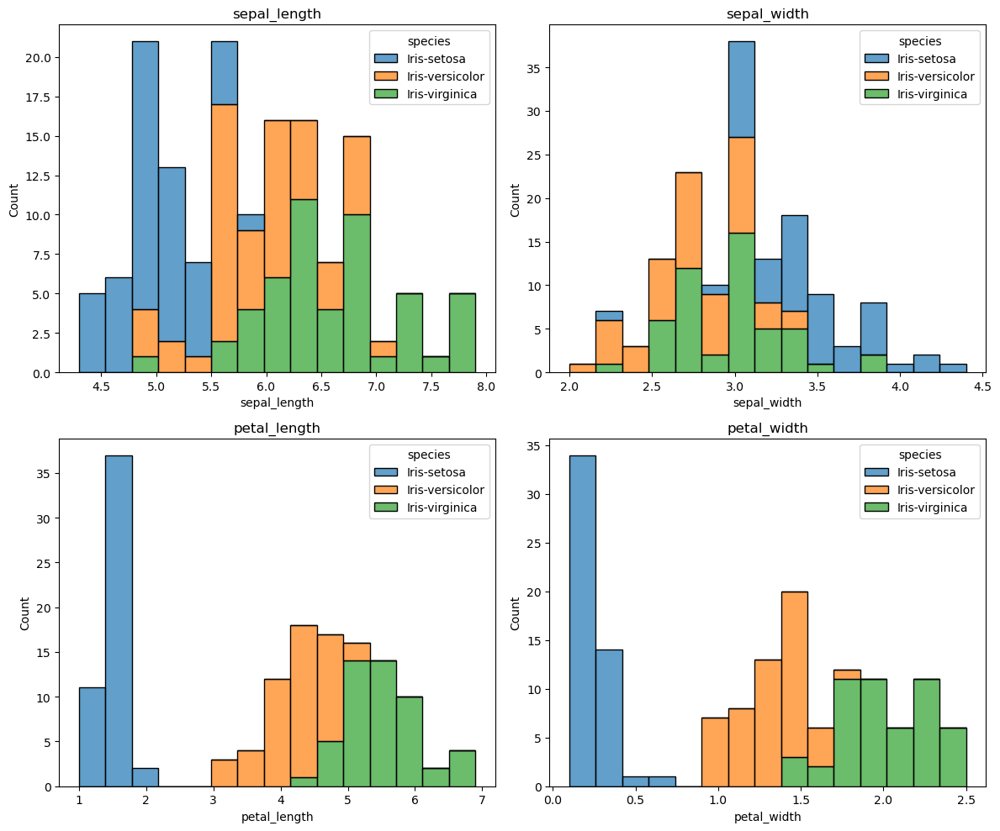

In [9]:
features = ['sepal_length','sepal_width','petal_length','petal_width']

fig, axes = plt.subplots(2, 2, figsize=(12,10))

for ax, feat in zip(axes.flatten(), features):
    sns.histplot(
        data=iris_data,
        x=feat,
        hue='species',
        multiple='stack',
        bins=15,
        alpha=0.7,
        ax=ax
    )
    ax.set_title(feat)
    ax.set_xlabel(feat)
    ax.set_ylabel("Count")

plt.tight_layout()
plt.show()


- Sepal Length: Shows moderate overlap between species, particularly between Versicolor and Virginica, making classification based solely on this feature challenging.
- Sepal Width: Distributions overlap significantly, especially between Versicolor and Virginica. Setosa tends to have relatively wider sepals compared to the others.
- Petal Length: Clearly distinguishes Setosa from the other species, while Versicolor and Virginica have some overlap but are still relatively distinct.
- Petal Width: Demonstrates a strong separation of Setosa from other species, with minor overlap between Versicolor and Virginica.

Petal dimensions (petal_length and petal_width) provide clearer distinctions between Iris species, making them the most important features for accurate classification.
Sepal dimensions (sepal_length and sepal_width) have limited discriminatory power due to overlaps among species.

In [10]:
species=['Iris-setosa','Iris-versicolor','Iris-virginica']

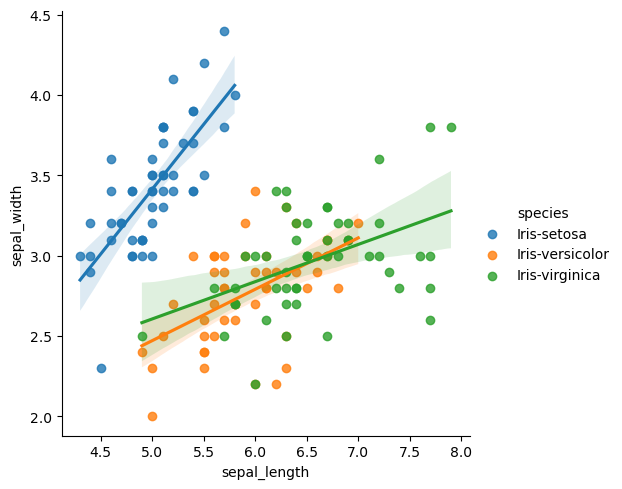

In [11]:
sns.lmplot(x="sepal_length", y="sepal_width", data=iris_data, hue="species")

This plot reveals a moderate correlation between sepal length and sepal width. The Iris-setosa species clearly separates itself, showcasing wider sepals, while Iris-versicolor and Iris-virginica have more overlapping measurements.

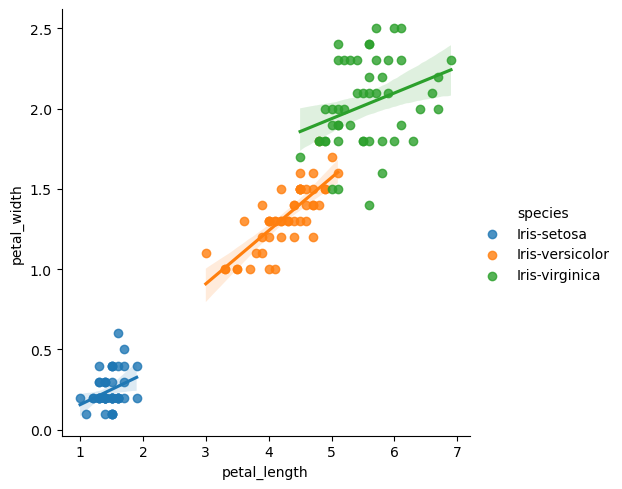

In [12]:
# for i in range(3):
#     x = iris_data[iris_data["species"]==species[i]]
#     plt.scatter(x["petal_length"], x["petal_width"],
#                label = species[i])
# plt.xlabel("Petal length")
# plt.ylabel("Petal width")
# plt.legend()

sns.lmplot(x="petal_length", y="petal_width", data=iris_data, hue="species")

A strong positive correlation is evident here, with petal length and petal width distinctly separating the species. Iris-setosa petals are smallest, while Iris-virginica has the largest petals, clearly differentiating them from Iris-versicolor.

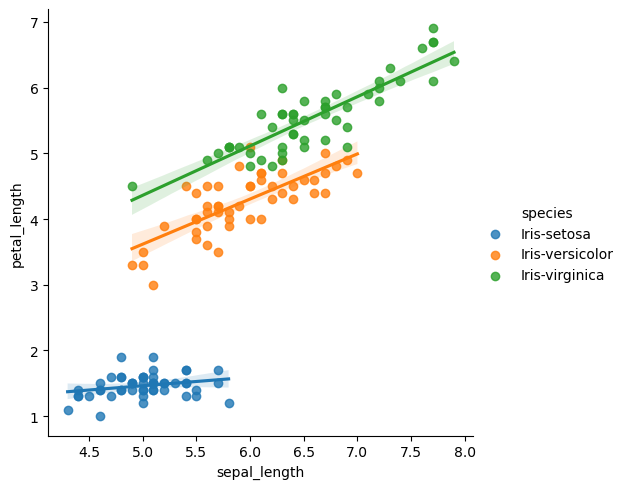

In [13]:
# for i in range(3):
#     x = iris_data[iris_data["species"]==species[i]]
#     plt.scatter(x["sepal_length"], x["petal_length"],
#                label = species[i])
# plt.xlabel("Sepal length")
# plt.ylabel("Petal length")
# plt.legend()

sns.lmplot(x="sepal_length", y="petal_length", data=iris_data, hue="species")

This visualization highlights a clear distinction, particularly between Iris-setosa and the other species, based on petal length. Iris-versicolor and Iris-virginica show partial overlap but maintain distinct growth trends with increasing sepal length.

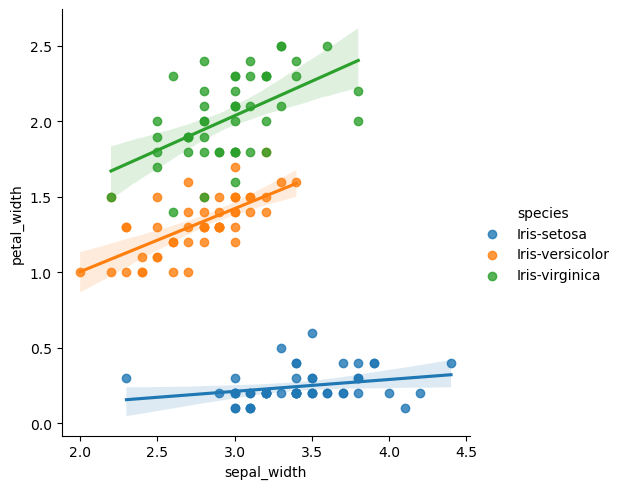

In [14]:
# for i in range(3):
#     x = iris_data[iris_data["species"]==species[i]]
#     plt.scatter(x["sepal_width"], x["petal_width"],
#                label = species[i])
# plt.xlabel("Sepal width")
# plt.ylabel("Petal width")
# plt.legend()

sns.lmplot(x="sepal_width", y="petal_width", data=iris_data, hue="species")

The plot demonstrates effective separation, especially for Iris-setosa, with significantly smaller petal widths. Iris-versicolor and Iris-virginica species are also reasonably distinguishable by their petal widths, though some overlap occurs.

<Axes: xlabel='species', ylabel='petal_width'>

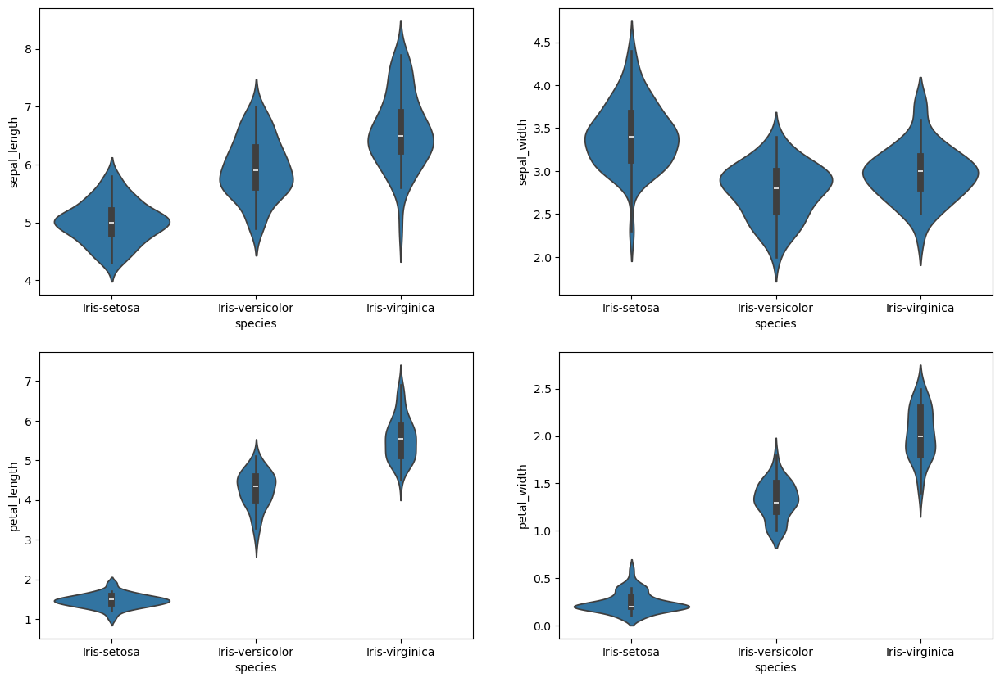

In [15]:
plt.figure(figsize=(15, 10))
plt.subplot(2,2,1)
sns.violinplot(data = iris_data, x="species", y="sepal_length")
plt.subplot(2,2,2)
sns.violinplot(data = iris_data, x="species", y="sepal_width")
plt.subplot(2,2,3)
sns.violinplot(data = iris_data, x="species", y="petal_length")
plt.subplot(2,2,4)
sns.violinplot(data = iris_data, x="species", y="petal_width")

These violin plots show the distribution and density of measurements for each Iris species. Iris-setosa is distinctly separated in both petal length and petal width, displaying narrower and smaller measurements compared to the others. Iris-versicolor and Iris-virginica have overlapping sepal width distributions but differ notably in sepal length and petal dimensions, facilitating species differentiation.

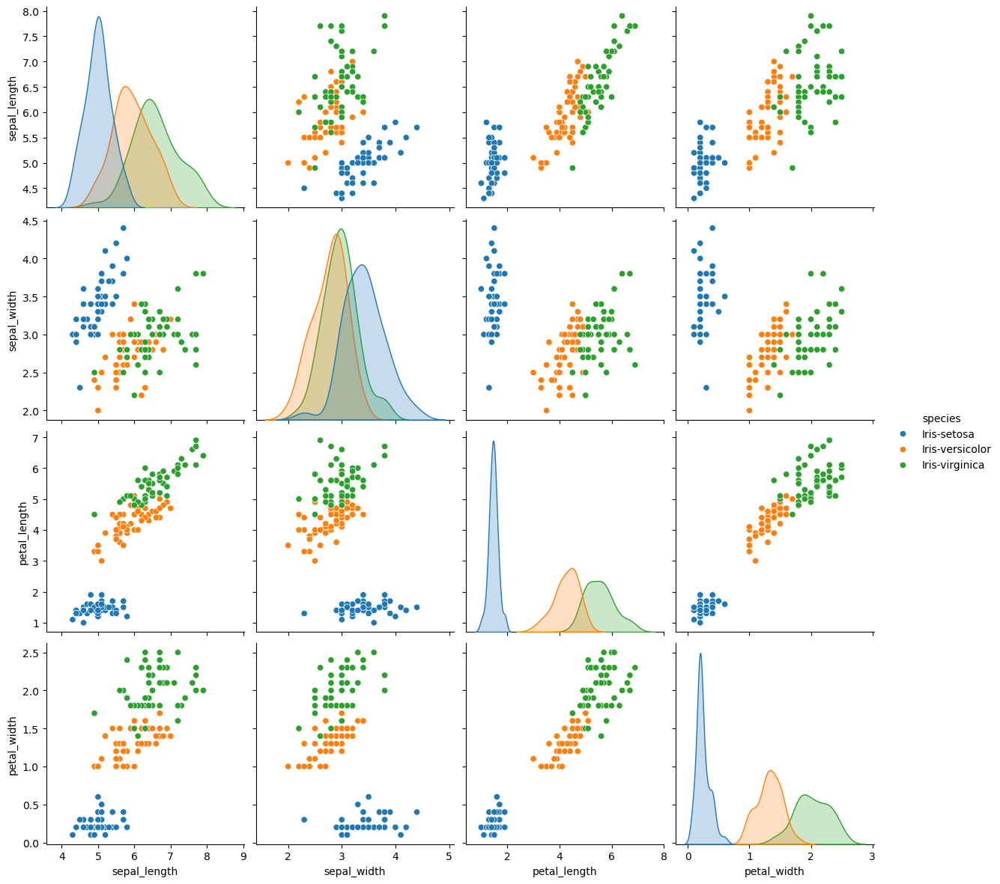

In [16]:
sns.pairplot(iris_data, hue="species", height=3)

In [17]:
correlation_matrix = iris_data.corr(numeric_only=True)

<Axes: >

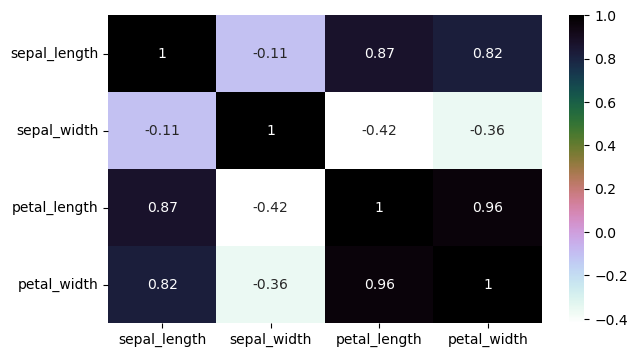

In [18]:
plt.figure(figsize=(7, 4))
sns.heatmap(correlation_matrix,
           annot=True,
           cmap="cubehelix_r")

The heatmap illustrates the correlation coefficients between different features of the Iris dataset. Petal length and petal width show the highest positive correlation (0.96), indicating these features strongly vary together. Similarly, sepal length has a high positive correlation with both petal length (0.87) and petal width (0.82), suggesting these three attributes are closely related. In contrast, sepal width is weakly negatively correlated with other features, suggesting limited interdependence.

In [19]:
from sklearn.preprocessing import LabelEncoder

le=LabelEncoder()

iris_data["species"] = le.fit_transform(iris_data["species"])
iris_data

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,2
146,6.3,2.5,5.0,1.9,2
147,6.5,3.0,5.2,2.0,2
148,6.2,3.4,5.4,2.3,2


In [20]:
X = iris_data.drop(columns=['species'])
y = iris_data['species']
print(X, y)

     sepal_length  sepal_width  petal_length  petal_width
0             5.1          3.5           1.4          0.2
1             4.9          3.0           1.4          0.2
2             4.7          3.2           1.3          0.2
3             4.6          3.1           1.5          0.2
4             5.0          3.6           1.4          0.2
..            ...          ...           ...          ...
145           6.7          3.0           5.2          2.3
146           6.3          2.5           5.0          1.9
147           6.5          3.0           5.2          2.0
148           6.2          3.4           5.4          2.3
149           5.9          3.0           5.1          1.8

[150 rows x 4 columns] 0      0
1      0
2      0
3      0
4      0
      ..
145    2
146    2
147    2
148    2
149    2
Name: species, Length: 150, dtype: int64


## Cross-Validation & Model Comparison

> In this section, we evaluate multiple machine learning models using 5-fold cross-validation to determine which performs best on the Iris dataset. Metrics such as Accuracy, Precision, Recall, and F1-score are computed to comprehensively assess each model's performance.

In [21]:
from sklearn.metrics import accuracy_score, make_scorer, precision_score, recall_score, f1_score
from sklearn.model_selection import cross_validate
from sklearn import ensemble
from sklearn import gaussian_process
from sklearn import linear_model
from sklearn import naive_bayes
from sklearn import neighbors
from sklearn import svm
from sklearn import tree
from sklearn import discriminant_analysis
from xgboost import XGBClassifier

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [22]:
models=[
    # Ensemble Methods
    ensemble.AdaBoostClassifier(),
    ensemble.BaggingClassifier(),
    ensemble.ExtraTreesClassifier(),
    ensemble.GradientBoostingClassifier(),
    ensemble.RandomForestClassifier(),

    # Gaussian Processes
    gaussian_process.GaussianProcessClassifier(),
    
    # GLM
    linear_model.LogisticRegressionCV(max_iter=1000),
    linear_model.PassiveAggressiveClassifier(),
    linear_model.RidgeClassifierCV(),
    linear_model.SGDClassifier(),
    linear_model.Perceptron(),
    
    # Naive Bayes
    naive_bayes.BernoulliNB(),
    naive_bayes.GaussianNB(),
    
    # Nearest Neighbor
    neighbors.KNeighborsClassifier(),
    
    # SVM
    svm.SVC(probability=True),
    svm.NuSVC(probability=True),
    svm.LinearSVC(),
    
     # Trees    
    tree.DecisionTreeClassifier(),
    tree.ExtraTreeClassifier(),
    
    # Discriminant Analysis
    discriminant_analysis.LinearDiscriminantAnalysis(),
    discriminant_analysis.QuadraticDiscriminantAnalysis(),
    
    # XGBoost
    XGBClassifier()
]

In [23]:
scoring = {
    "Accuracy":  make_scorer(accuracy_score),
    "Precision": make_scorer(precision_score, average="macro", zero_division=1),
    "Recall":    make_scorer(recall_score,    average="macro"),
    "F1 Score":  make_scorer(f1_score,        average="macro"),
}

records = []
for model in models:
    name   = type(model).__name__
    cv_res = cross_validate(
        model, X, y,
        cv=5,
        scoring=scoring,
        return_train_score=False
    )
    row = {"Model": name}
    for metric in scoring:
        scores = cv_res[f"test_{metric}"]
        row[f"{metric} Mean"] = scores.mean()
        row[f"{metric} Max"]  = scores.max()
    records.append(row)

df_metrics = pd.DataFrame(records).set_index("Model")
df_metrics = df_metrics.sort_values("Accuracy Mean", ascending=False)
df_metrics

,Accuracy Mean,Accuracy Max,Precision Mean,Precision Max,Recall Mean,Recall Max,F1 Score Mean,F1 Score Max
Model,,,,,,,,
QuadraticDiscriminantAnalysis,0.980000,1.000000,0.980606,1.000000,0.980000,1.000000,0.979983,1.000000
LinearDiscriminantAnalysis,0.980000,1.000000,0.980606,1.000000,0.980000,1.000000,0.979983,1.000000
PassiveAggressiveClassifier,0.973333,1.000000,0.976768,1.000000,0.973333,1.000000,0.973165,1.000000
LogisticRegressionCV,0.973333,1.000000,0.975556,1.000000,0.973333,1.000000,0.973199,1.000000
GaussianProcessClassifier,0.973333,1.000000,0.975758,1.000000,0.973333,1.000000,0.973266,1.000000
KNeighborsClassifier,0.973333,1.000000,0.976768,1.000000,0.973333,1.000000,0.973165,1.000000
BaggingClassifier,0.966667,1.000000,0.970707,1.000000,0.966667,1.000000,0.966482,1.000000
LinearSVC,0.966667,1.000000,0.967138,1.000000,0.966667,1.000000,0.966617,1.000000
RandomForestClassifier,0.966667,1.000000,0.970707,1.000000,0.966667,1.000000,0.966482,1.000000


The table ranks models based on their mean accuracy, with Quadratic Discriminant Analysis, Linear Discriminant Analysis, KNeighborsClassifier, and Logistic Regression achieving the highest accuracy of approximately 97-98%. Models such as BernoulliNB and Perceptron demonstrate comparatively weaker performance, indicating less suitability for this particular dataset.

Since the Iris dataset is relatively small, using a simple train/test split could result in unreliable performance metrics due to the limited number of test samples. To address this, we employ 5-fold cross-validation, which rotates the evaluation across different subsets of the data. This approach improves reliability, minimizes variance from random splits, and ensures that every data point contributes to both training and validation. As a result, our model evaluation becomes more stable, generalizable, and fair when comparing multiple algorithms.

In [24]:
import plotly.express as px

mean_cols = [c for c in df_metrics.columns if c.endswith("Mean")]
df_mean = df_metrics[mean_cols].copy()
df_mean.columns = [c.replace(" Mean", "") for c in df_mean.columns]

df_long = (
    df_mean
    .reset_index()
    .melt(id_vars="Model", var_name="Metric", value_name="Mean score")
)

fig = px.bar(
    df_long,
    x="Model", y="Mean score",
    color="Metric",
    barmode="group",
    title="5-Fold CV Mean Scores by Model",
    labels={"Mean score": "CV Mean Score"}
)
fig.update_layout(xaxis_tickangle=-45, template="plotly_white")
fig.show()

The bar plot visually summarizes the mean scores for Accuracy, Precision, Recall, and F1-score across models. It clearly illustrates which classifiers consistently perform well and highlights performance discrepancies among models, providing intuitive insights into model robustness and reliability.

## Model Training & 2-D Decision Boundaries
> In this section, we implement five widely used machine learning algorithms—Logistic Regression, Decision Tree, Random Forest, Support Vector Machines (SVM), and K Nearest Neighbors (KNN)—to classify Iris flower species. To visualize their decision-making, we project the dataset onto two dimensions using PCA and plot the decision boundaries generated by each model.

Data preparation - We reduce the original Iris data to two principal components (PCs) to simplify visualization.<br>
Model pipelines - For each classifier, we create a pipeline that includes scaling, dimensionality reduction (PCA), and model fitting.<br>
Decision boundaries - We visualize how each algorithm separates the data points (representing different Iris species) in the reduced 2-D PCA space.

✓ Fitted pipeline for LogisticRegression
✓ Fitted pipeline for DecisionTree
✓ Fitted pipeline for RandomForest
✓ Fitted pipeline for SVM
✓ Fitted pipeline for KNeighbors


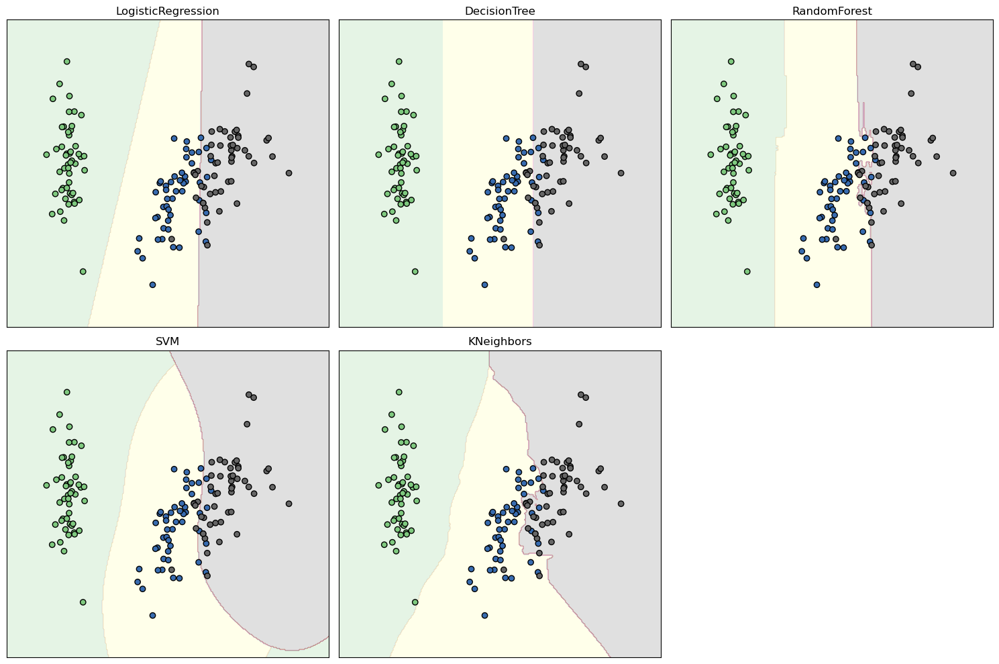

In [25]:
from sklearn.datasets           import load_iris
from sklearn.pipeline           import Pipeline
from sklearn.preprocessing      import StandardScaler
from sklearn.decomposition      import PCA
from sklearn.linear_model       import LogisticRegression
from sklearn.tree               import DecisionTreeClassifier
from sklearn.ensemble           import RandomForestClassifier
from sklearn.svm                import SVC
from sklearn.neighbors          import KNeighborsClassifier

iris = load_iris()
X, y = iris.data, iris.target
names = iris.target_names

classifiers = {
    "LogisticRegression": LogisticRegression(C=1, penalty='l2', solver='lbfgs', random_state=42),
    "DecisionTree"      : DecisionTreeClassifier(max_depth=3, random_state=42),
    "RandomForest"      : RandomForestClassifier(n_estimators=100, random_state=42),
    "SVM"               : SVC(kernel='rbf', probability=True, random_state=42),
    "KNeighbors"        : KNeighborsClassifier(n_neighbors=5)
}

pipelines = {}
for name, clf in classifiers.items():
    pipelines[name] = Pipeline([
        ("scaler", StandardScaler()),
        ("pca",    PCA(n_components=2, random_state=42)),
        ("clf",    clf)
    ])

for name, pipe in pipelines.items():
    pipe.fit(X, y)
    print(f"✓ Fitted pipeline for {name}")

pca_model = pipelines["LogisticRegression"].named_steps["pca"]
X2 = pca_model.transform(pipelines["LogisticRegression"].named_steps["scaler"].transform(X))

x_min, x_max = X2[:,0].min() - 1, X2[:,0].max() + 1
y_min, y_max = X2[:,1].min() - 1, X2[:,1].max() + 1
xx, yy     = np.meshgrid(
    np.linspace(x_min, x_max, 300),
    np.linspace(y_min, y_max, 300)
)
grid_points = np.c_[xx.ravel(), yy.ravel()]
fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes = axes.flatten()

for ax, (name, pipe) in zip(axes, pipelines.items()):
    clf = pipe.named_steps["clf"]
    Z   = clf.predict(grid_points).reshape(xx.shape)
    ax.contourf(xx, yy, Z, alpha=0.2, cmap='Accent')
    ax.scatter(
        X2[:,0], X2[:,1],
        c=y, cmap='Accent', edgecolor='k'
    )

    ax.set_title(name)
    ax.set_xticks([]); ax.set_yticks([])

if len(pipelines) < len(axes):
    for ax in axes[len(pipelines):]:
        ax.axis('off')

plt.tight_layout()
plt.show()

1. **Logistic Regression**: Produces a linear decision boundary clearly distinguishing Iris setosa, while struggling slightly in separating Iris versicolor and Iris virginica due to their overlapping features. 
<br>
<br>
2. **Decision Tree**: Generates rectangular splits and a step-wise decision boundary, effectively separating setosa from others but creating slightly jagged divisions between versicolor and virginica.
<br>
<br>
3. **Random Forest**: Creates smoother boundaries compared to a single decision tree, effectively handling overlaps through an ensemble of trees, which reduces overfitting and provides more generalized boundaries.
<br>
<br>
4. **Support Vector Machines (SVM)**: Produces smooth, curved decision boundaries that adapt well to overlapping points, clearly distinguishing between the three species with minimal overlap.
<br>
<br>
5. **K Nearest Neighbors (KNN)**: Highly non-linear. Generates irregular, complex decision boundaries influenced by the local distribution of points, creating "island-like" regions and highly adaptable boundaries but risking overfitting.

In [26]:
import warnings

warnings.filterwarnings(
    "ignore",
    message=".*has feature names, but .* was fitted without feature names.*"
)

## Model Interpretability

> In this section, we aim to interpret and understand the behavior of our machine learning models to see which features (flower characteristics) most significantly influence their predictions. Interpretability helps ensure model reliability and provides deeper insights into the decision-making process, which is critical in real-world applications.

1. Feature Importances / Coefficients:
For linear models like Logistic Regression, we directly inspect model coefficients.
For tree-based models (Decision Tree, Random Forest), we analyze the built-in feature importances.
For non-linear and instance-based models (SVM, KNeighbors), we utilize Permutation Importance as a fallback method since these models don’t provide explicit feature importances.
<br><br>
2. SHAP (SHapley Additive exPlanations):
SHAP provides deeper insights by calculating how each feature impacts the model’s predictions across all samples.
It visualizes feature impacts, highlighting how feature values contribute positively or negatively to predictions.

C:\Users\Laylo Karimova\.conda\envs\ML_projects\Lib\site-packages\tqdm\auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



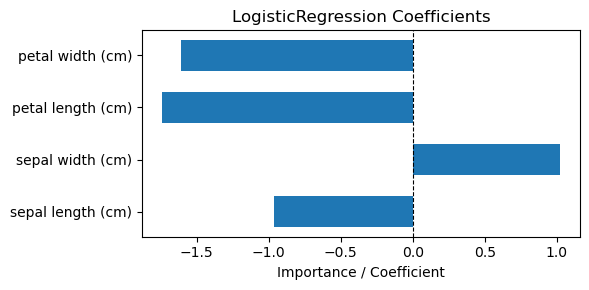

SHAP Summary for LogisticRegression:


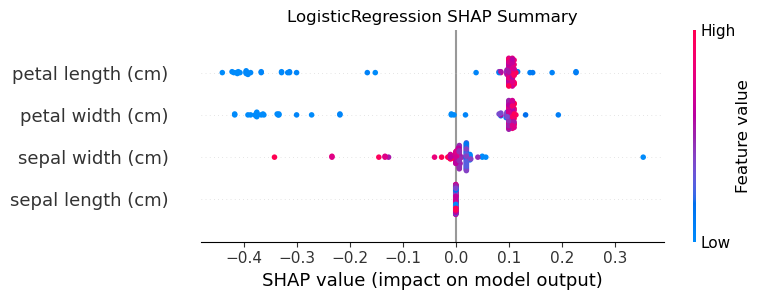

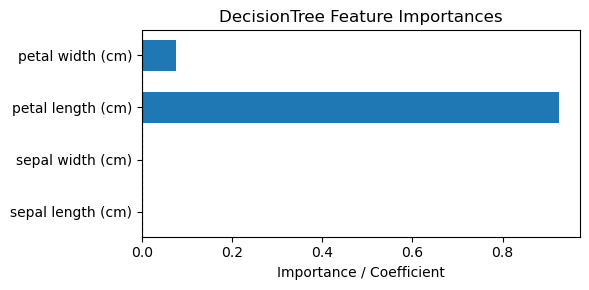

SHAP Summary for DecisionTree:


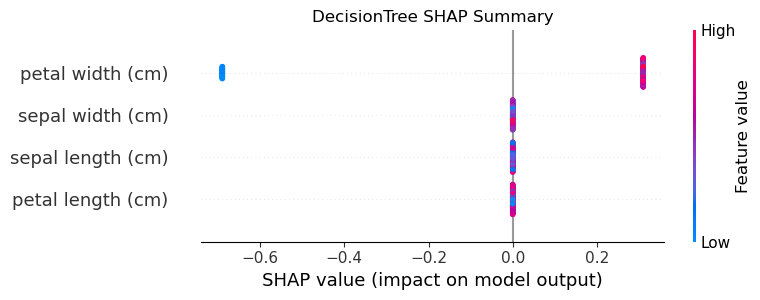

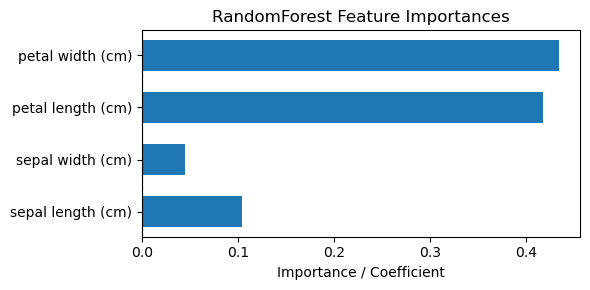

SHAP Summary for RandomForest:


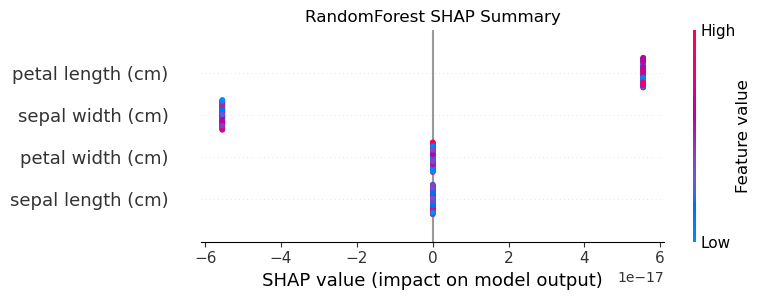

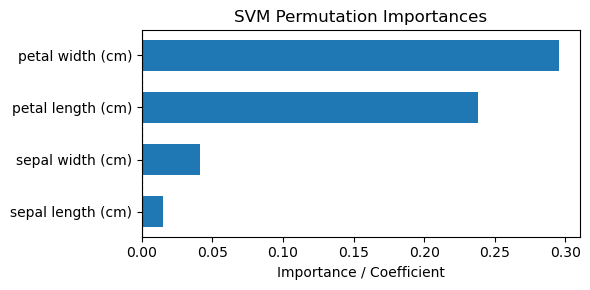

SHAP Summary for SVM:


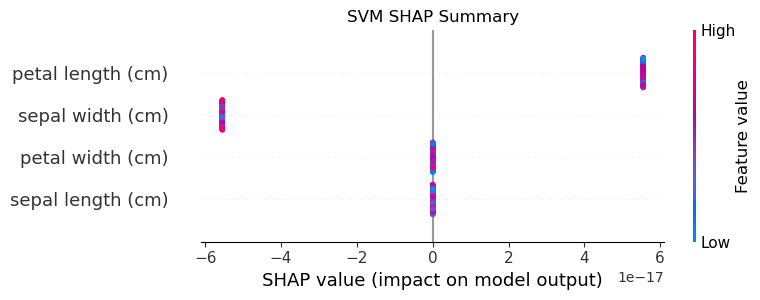

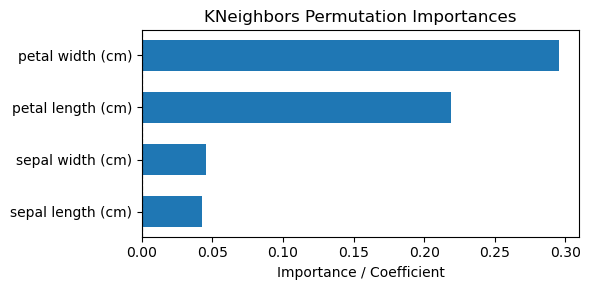

SHAP Summary for KNeighbors:


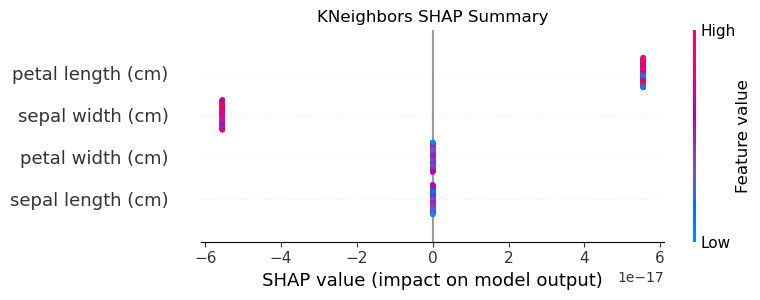

In [27]:
from sklearn.inspection   import permutation_importance
import shap

X_feat, y_feat = X_train, y_train  
pipelines     = pipelines 
feature_names = iris.feature_names

for name, pipe in pipelines.items():
    clf = pipe.named_steps["clf"]

    if "pca" in pipe.named_steps:
        raw_pipe = Pipeline([
            ("scaler", pipe.named_steps["scaler"]),
            ("clf",    clf)
        ])
        raw_pipe.fit(X_feat, y_feat)
        model_for_imp = raw_pipe.named_steps["clf"]
    else:
        model_for_imp = clf

    if hasattr(model_for_imp, "coef_"):
        imp_vals = model_for_imp.coef_[0]
        title    = f"{name} Coefficients"
    elif hasattr(model_for_imp, "feature_importances_"):
        imp_vals = model_for_imp.feature_importances_
        title    = f"{name} Feature Importances"
    else:
        perm = permutation_importance(
            raw_pipe if "raw_pipe" in locals() else pipe,
            X_feat, y_feat,
            n_repeats=10, random_state=42, n_jobs=-1
        )
        imp_vals = perm.importances_mean
        title    = f"{name} Permutation Importances"

    y_pos = np.arange(len(imp_vals))
    plt.figure(figsize=(6,3))
    plt.barh(y_pos, imp_vals, height=0.6, align="center")
    plt.yticks(y_pos, feature_names)
    plt.axvline(0, color="k", linestyle="--", linewidth=0.8)
    plt.xlabel("Importance / Coefficient")
    plt.title(title)
    plt.tight_layout()
    plt.show()

    explainer  = shap.Explainer(model_for_imp.predict, X_feat)
    shap_vals  = explainer(X_feat)
    print(f"SHAP Summary for {name}:")
    shap.summary_plot(shap_vals, X_feat, feature_names=feature_names, show=False)
    plt.title(f"{name} SHAP Summary")
    plt.tight_layout()
    plt.show()

**Logistic Regression**<br>
- *Coefficients:*
Sepal width positively impacts classification significantly, while petal length and width have strong negative coefficients. It means shorter and narrower petals strongly associate with a particular class, while wider sepals relate positively to others.

- *SHAP Summary:*
Petal length and width consistently have higher SHAP values, meaning they're highly influential in distinguishing species clearly.

**Decision Tree**<br>
- *Feature Importance:*
Petal length emerges as highly dominant, showing the decision tree predominantly uses petal length to split species.

- *SHAP Summary:*
Petal length clearly separates species; points distinctly cluster indicating its dominant predictive power.

**Random Forest**<br>
- *Feature Importance:*
Petal length and width have similar and strong influences, confirming their critical roles in species separation.

- *SHAP Summary:*
Like the Decision Tree, petal dimensions remain critical; SHAP plots further confirm petal length and width consistently guide predictions.

**SVM (Permutation Importance)**<br>
- *Feature Importance:*
Petal width and length again stand out. Even with permutation, petal dimensions strongly affect accuracy, reflecting their inherent importance.

- *SHAP Summary:*
While SVM is less transparent, SHAP confirms petal features consistently drive species predictions.

**KNeighbors (Permutation Importance)**<br>
- *Feature Importance:*
Petal width strongly influences the classification, highlighting the non-linear importance of petal measurements.

- *SHAP Summary:*
SHAP reveals clear patterns where petal dimensions significantly influence individual predictions, though more dispersed due to instance-based nature.

## Baseline & Learning Curves Analysis

We compare our models against a simple baseline classifier and evaluate learning curves to understand training behavior.

In [28]:
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import cross_val_score

baseline       = DummyClassifier(strategy="most_frequent")
baseline_score = cross_val_score(
    baseline, X, y, cv=5, scoring="accuracy"
).mean()

print(f"Baseline (most frequent) accuracy: {baseline_score:.3f}")

Baseline (most frequent) accuracy: 0.333


We established a baseline using a trivial predictor (most frequent class) to emphasize the significance of our sophisticated models. All our models substantially outperformed the baseline, validating their practical effectiveness.

Generating learning curve for LogisticRegression...


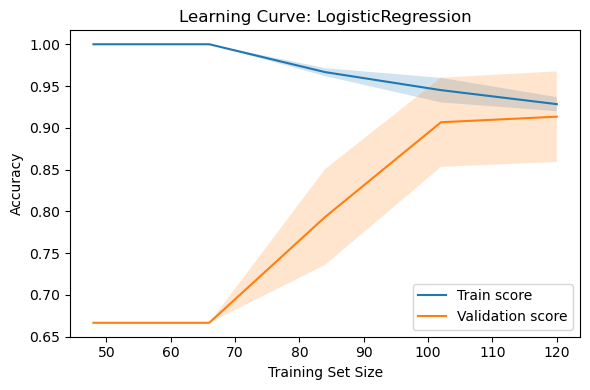

Generating learning curve for DecisionTree...


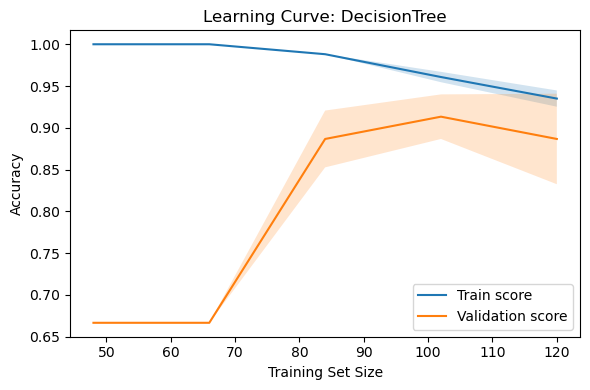

Generating learning curve for RandomForest...


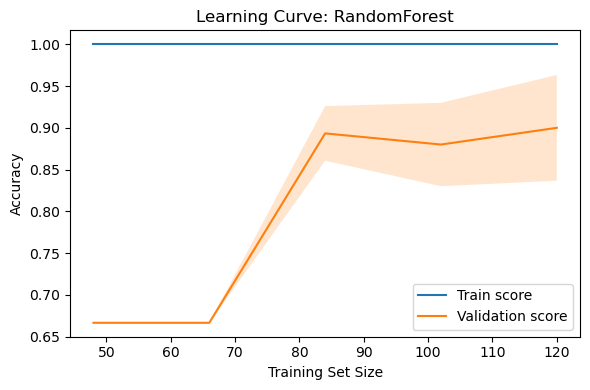

Generating learning curve for SVM...


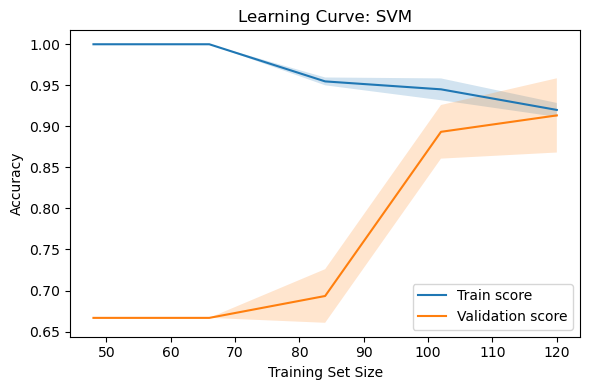

Generating learning curve for KNeighbors...


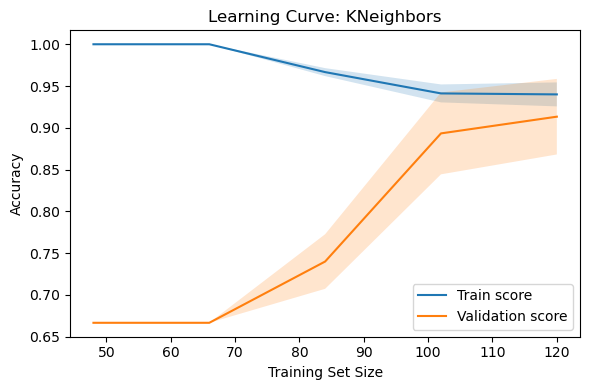

In [29]:
from sklearn.model_selection import learning_curve

for name, pipe in pipelines.items():
    print(f"Generating learning curve for {name}...")
    train_sizes, train_scores, val_scores = learning_curve(
        pipe, X, y,
        train_sizes=np.linspace(0.4, 1.0, 5),
        cv=5,
        scoring="accuracy",
        n_jobs=-1
    )

    train_mean = train_scores.mean(axis=1)
    train_std = train_scores.std(axis=1)
    val_mean = val_scores.mean(axis=1)
    val_std = val_scores.std(axis=1)

    plt.figure(figsize=(6, 4))
    plt.plot(train_sizes, train_mean, label="Train score")
    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2)
    plt.plot(train_sizes, val_mean, label="Validation score")
    plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, alpha=0.2)
    plt.title(f"Learning Curve: {name}")
    plt.xlabel("Training Set Size")
    plt.ylabel("Accuracy")
    plt.legend(loc="best")
    plt.tight_layout()
    plt.show()

1. Logistic Regression<br>
Train Score starts high (~1.0) and slightly decreases as more data is used. Validation Score increases with training size and stabilizes around 0.93. Gap small gap = good generalization, no overfitting. Performs well even with small data, and generalizes reliably.

2. Decision Tree<br>
Train Score nearly 1.0 throughout — indicates overfitting. Validation Score lower than train score, around 0.89 with some drop at higher sizes. Gap large gap = high variance (overfitting).Needs pruning or deeper cross-validation to reduce variance.

3. Random Forest<br>
Train Score stays near 1.0 — ensembles are good at fitting training data. Validation Score much better than Decision Tree, peaks around 0.90–0.92. Gap moderate gap = slightly overfitting, but more stable than DT. Good performance and robustness, especially with small to mid data sizes.

4. SVM (Support Vector Machine)<br>
Train Score high but slightly lower than RandomForest or DT. Validation Score smooth increase and eventually converges toward 0.92–0.95. Gap minimal, especially at larger sizes = excellent generalization. Best balance between bias and variance, but computationally more expensive.

5. K-Nearest Neighbors (KNN)<br>
 Train score starts at 1.0 and drops as more data is used. Validation Score rises steadily, stabilizes around 0.89–0.91. Gap moderate = some overfitting. Very sensitive to data size and local structure. Performs decently but can be noisy.